In [28]:
import re
import csv
import math 
import random
import pandas as pd 
import numpy as np 
#4 Visualize the data using matplotlib and seaborn:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns 
import plotly.graph_objs as go
import plotly.offline as pyo
from scipy import stats
from plotly.subplots import make_subplots
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont

Check the general trend of internet usage to make sure it is still a good idea to be expanding right now

Internet usage increase Alphabetical legend, which is too crowded and doesn't tell us much

C:\Users\user\AppData\Local\Temp\ipykernel_21016\2468047236.py:14: FutureWarning:

The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.



C:\Users\user\AppData\Local\Temp\ipykernel_21016\2468047236.py:14: FutureWarning:

The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.





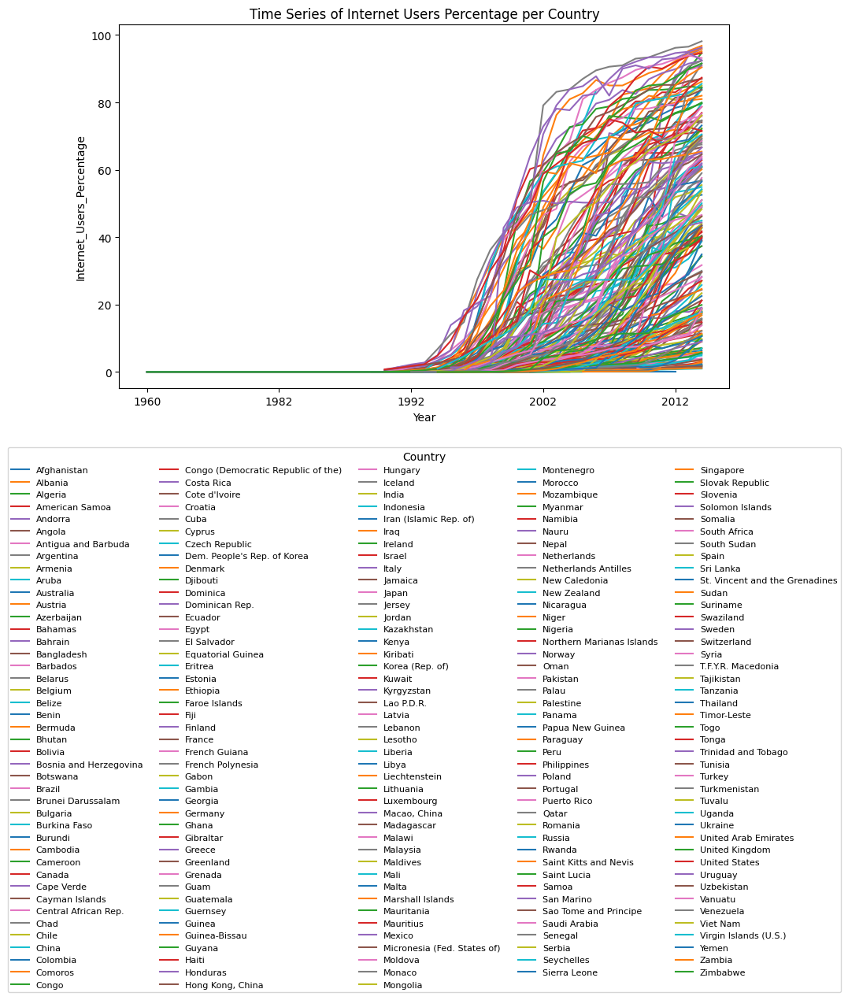

In [29]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read the data
csv_file = 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'
df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore

# Clean the data
df = clean_data(df, 'Internet_Users_Percentage')

# Pivot the data to have years as rows and Internet_Users_Percentage as columns
df_pivot = df.pivot(index='Year', columns='Country', values='Internet_Users_Percentage')

# Create the line chart
df_pivot.plot(figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Internet_Users_Percentage')
plt.title('Time Series of Internet Users Percentage per Country')

#Move the legend to below the chart
plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

plt.show()


Sort legend by highest Internet users percentage in the final year, definitely makes it a little easier to read, and make sense of the data

C:\Users\user\AppData\Local\Temp\ipykernel_21016\3789559541.py:14: FutureWarning:

The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.



C:\Users\user\AppData\Local\Temp\ipykernel_21016\3789559541.py:14: FutureWarning:

The warn_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.





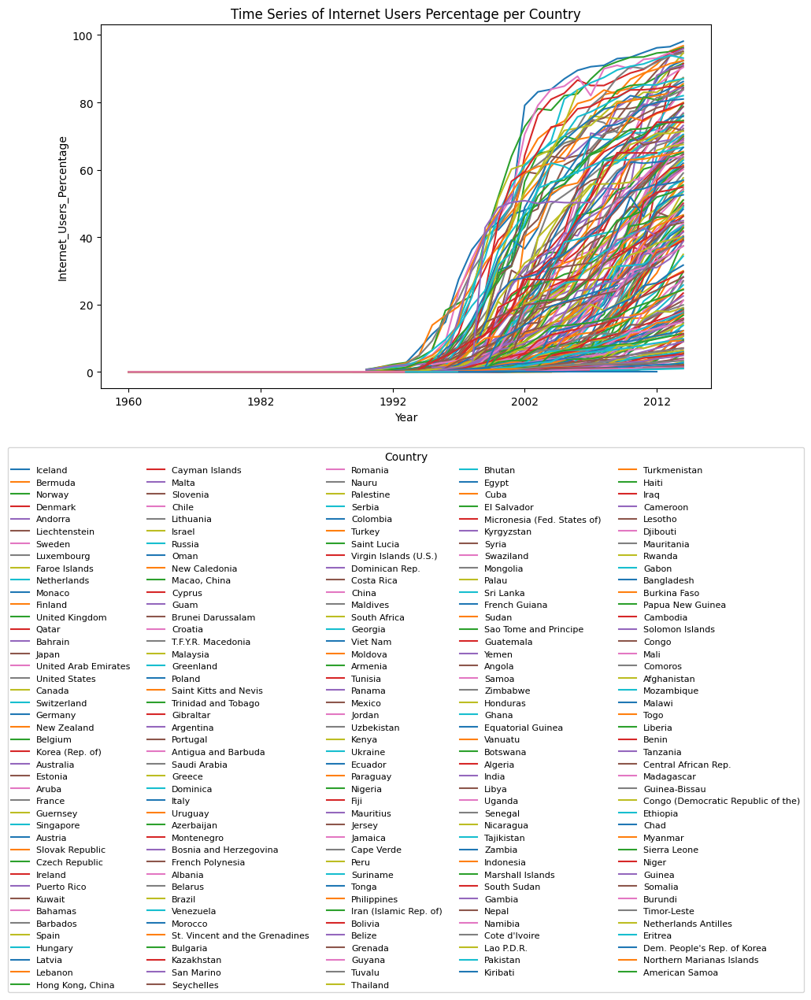

In [30]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Read the data
csv_file = 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'
df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True, error_bad_lines=False, warn_bad_lines=False) # type: ignore

# Clean the data
df = clean_data(df, 'Internet_Users_Percentage')

# Pivot the data to have years as rows and Internet_Users_Percentage as columns
df_pivot = df.pivot(index='Year', columns='Country', values='Internet_Users_Percentage')

# Create the line chart

# Sort the columns in descending order of their maximum values
df_pivot = df_pivot[df_pivot.max().sort_values(ascending=False).index]

# Create the line chart
df_pivot.plot(figsize=(10, 6))
plt.xlabel('Year')
plt.ylabel('Internet_Users_Percentage')
plt.title('Time Series of Internet Users Percentage per Country')

# Move the legend to below the chart
plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

plt.show()

I found a new datascience lib called plotly that can help when you have to graph large sets like these, where we are plotting around 200 lines

In [31]:


# Create traces for each country
traces = []
for col in df_pivot.columns:
    trace = go.Scatter(
        x=df_pivot.index,
        y=df_pivot[col],
        name=col,
        mode='lines',
        hovertemplate='%{y:.2f}%',
    )
    traces.append(trace)

# Create the layout for the chart
layout = go.Layout(
    title='Time Series of Internet Users Percentage per Country',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Internet Users Percentage'),
    legend=dict(title='Country', orientation='h', y=1.05, x=0.5),
)

# Create the figure
fig = go.Figure(data=traces, layout=layout)

# Show the chart
pyo.iplot(fig)

Start of new csv, fixed vs mobile

Check and see if we should be supporting desktop, web, mobile, or both, also see if there is a general trend in reduced land line usage, and increased mobile usage, countries with a decrease in landline usage and an increase in mobile usage are investing in there digital, mobile, infrastructure.

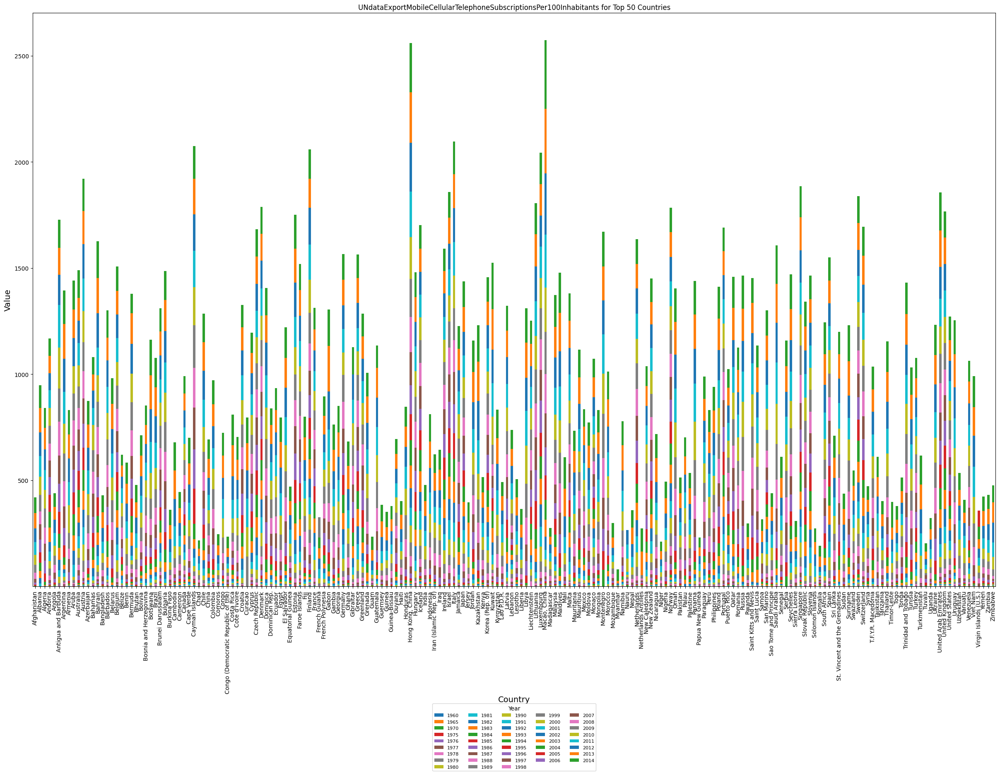

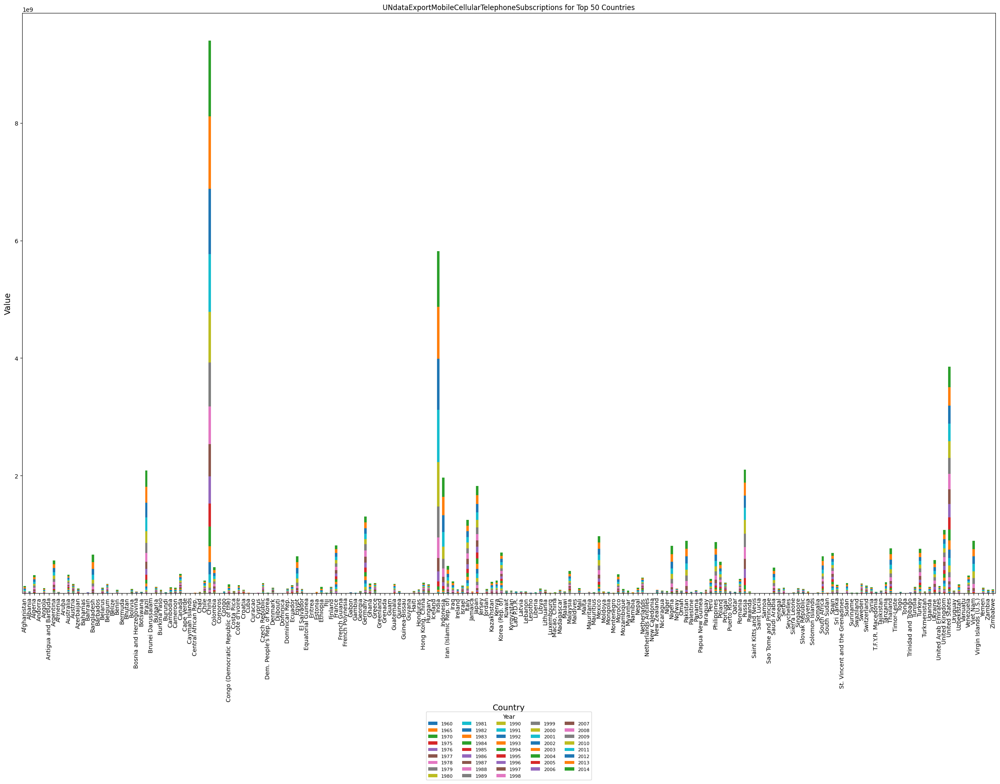

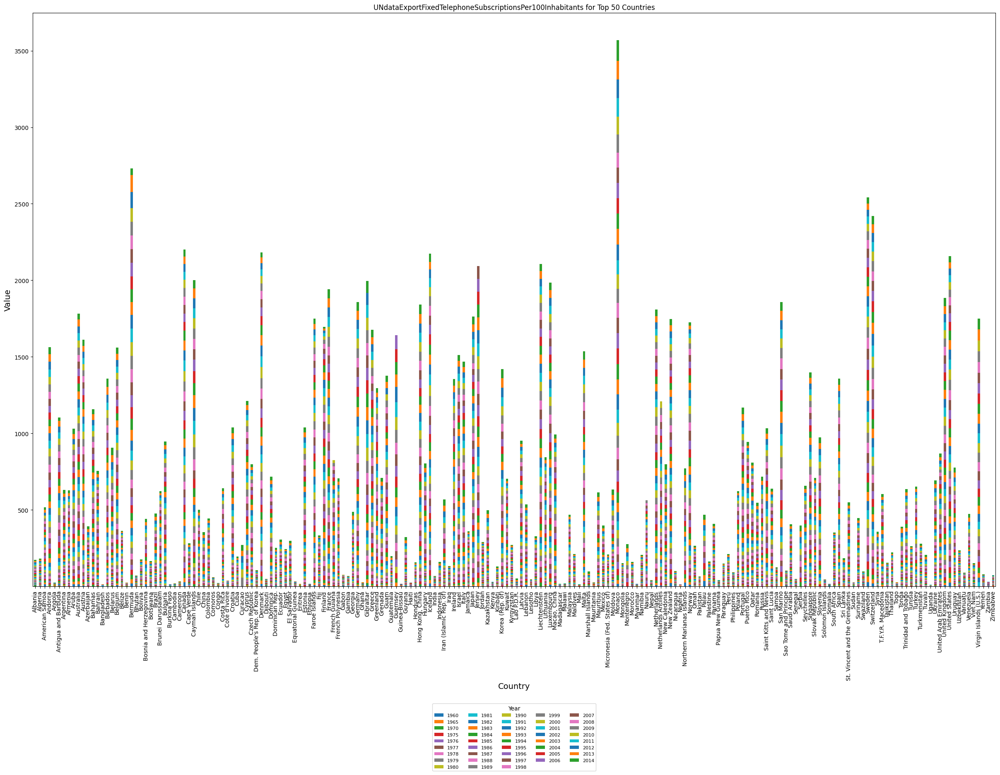

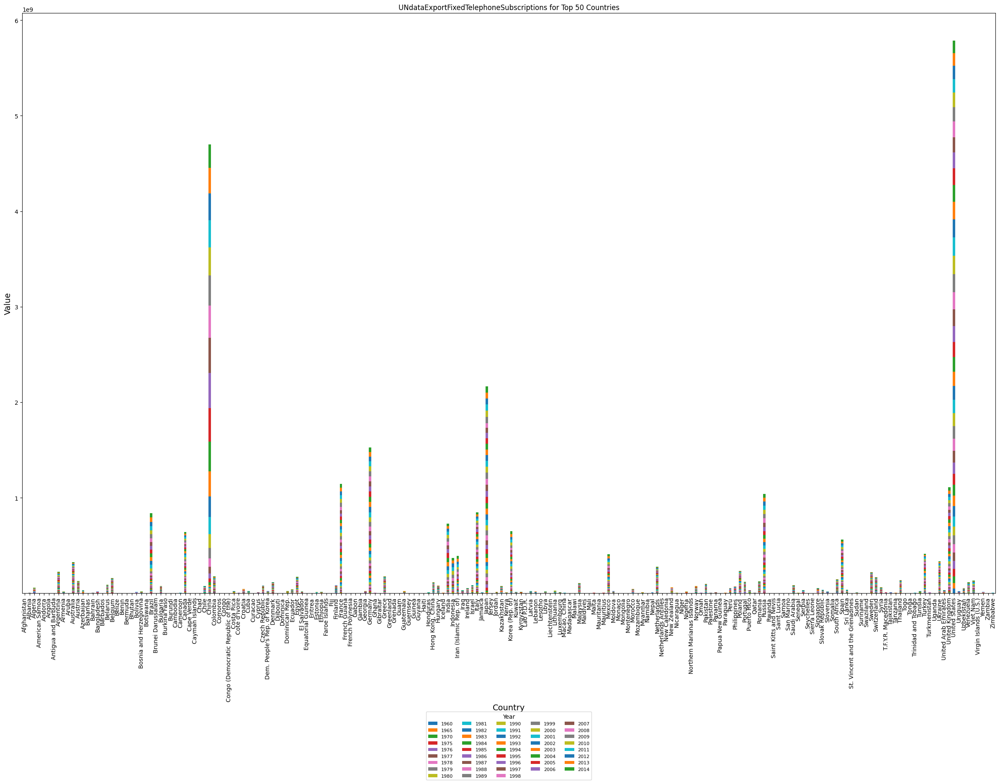

In [32]:
# Define the clean_data function
def clean_data(df):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 
             'UNdataExportMobileCellularTelephoneSubscriptions.csv', 
             'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 
             'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Get the top 50 countries
    top_50 = df_pivot.max().sort_values(ascending=False).head(200).index.tolist()
    # Filter the data to include only the top 50 countries
    df_top_50 = df[df['Country'].isin(top_50)]
    # Pivot the filtered data
    df_top_50_pivot = df_top_50.pivot(index='Country', columns='Year', values='Value')
  # Create the bar chart
    df_top_50_pivot.plot(kind='bar', stacked=True, figsize=(30, 18))
    plt.xlabel('Country', fontsize=14)
    plt.ylabel('Value', fontsize=14)
    plt.title(csv_file.split('.')[0] + ' for Top 50 Countries')

    # Get the unique years in the dataset
    unique_years = sorted(df['Year'].unique())

    # Set custom x-axis ticks based on the unique years
    plt.xticks(ticks=range(len(df_top_50_pivot.index)), labels=df_top_50_pivot.index, rotation=90)
    plt.legend(title='Year', labels=unique_years, fontsize=8, ncol=5, loc='upper center', bbox_to_anchor=(0.5, -0.2))
    plt.show()


Alphabetically sorted legend for these again does not tell us much

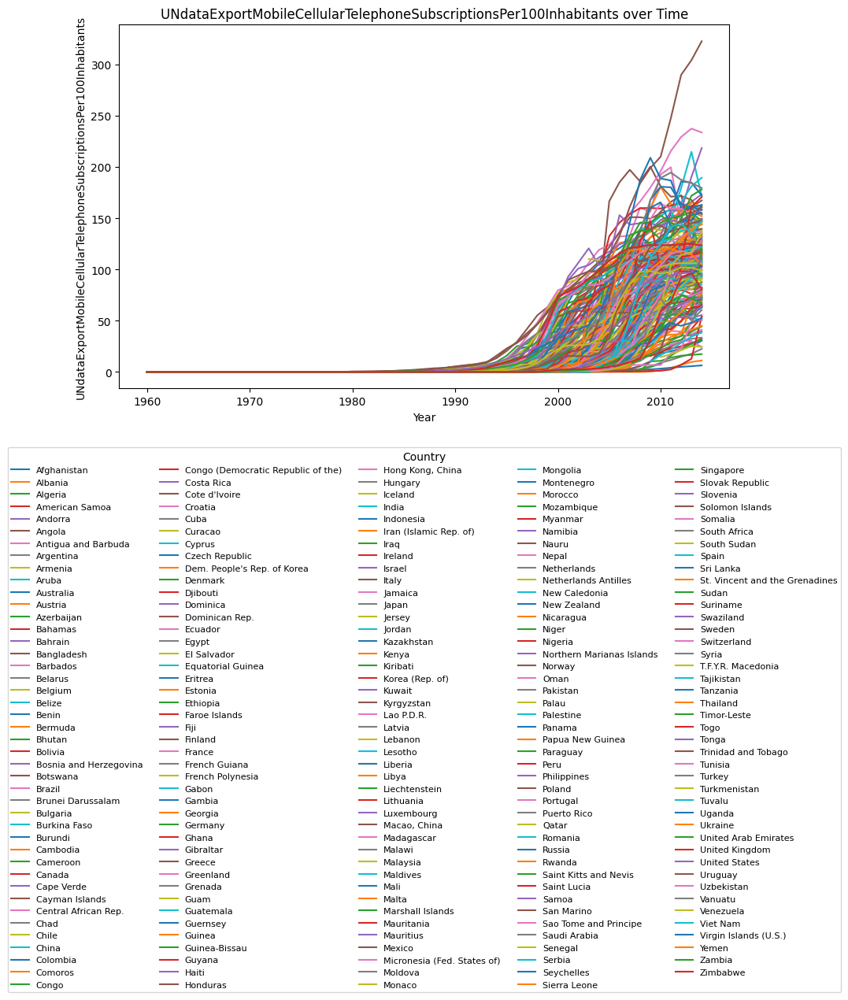

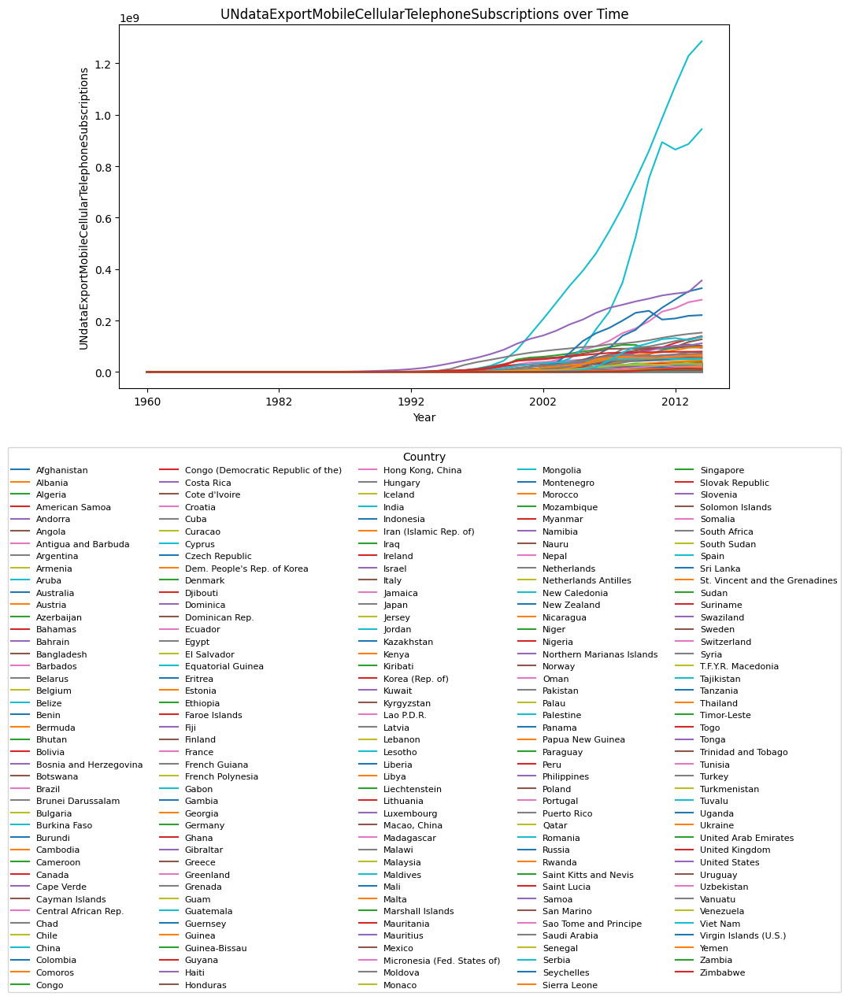

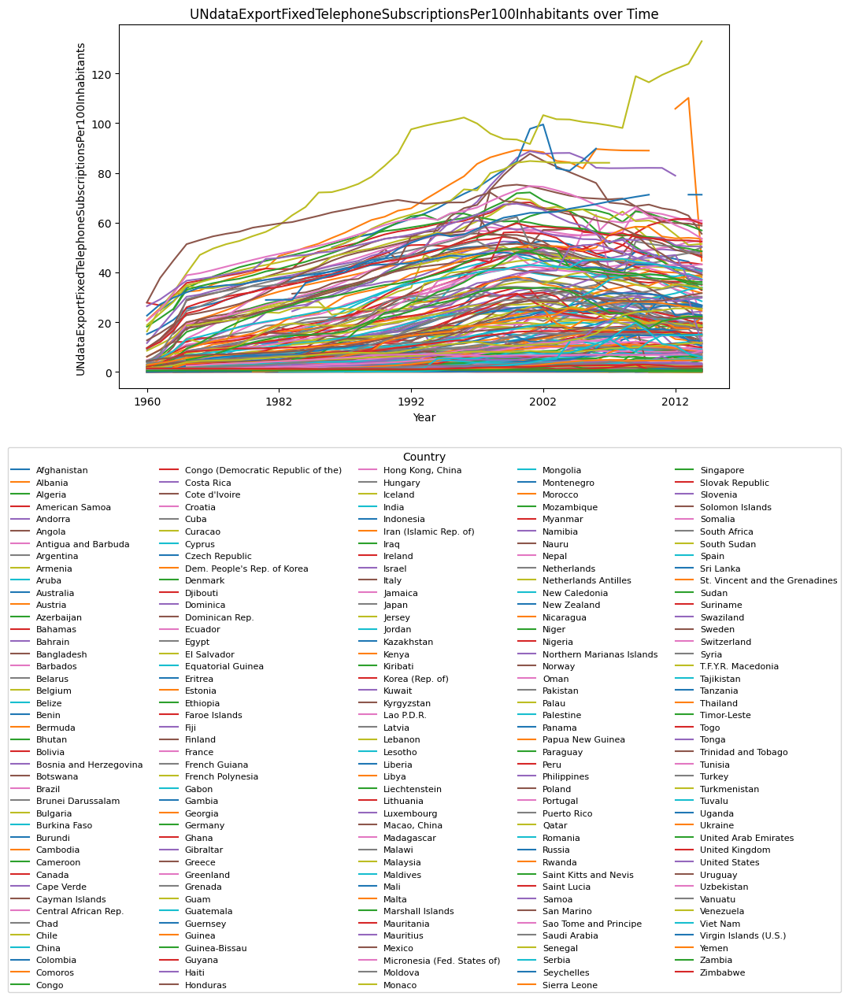

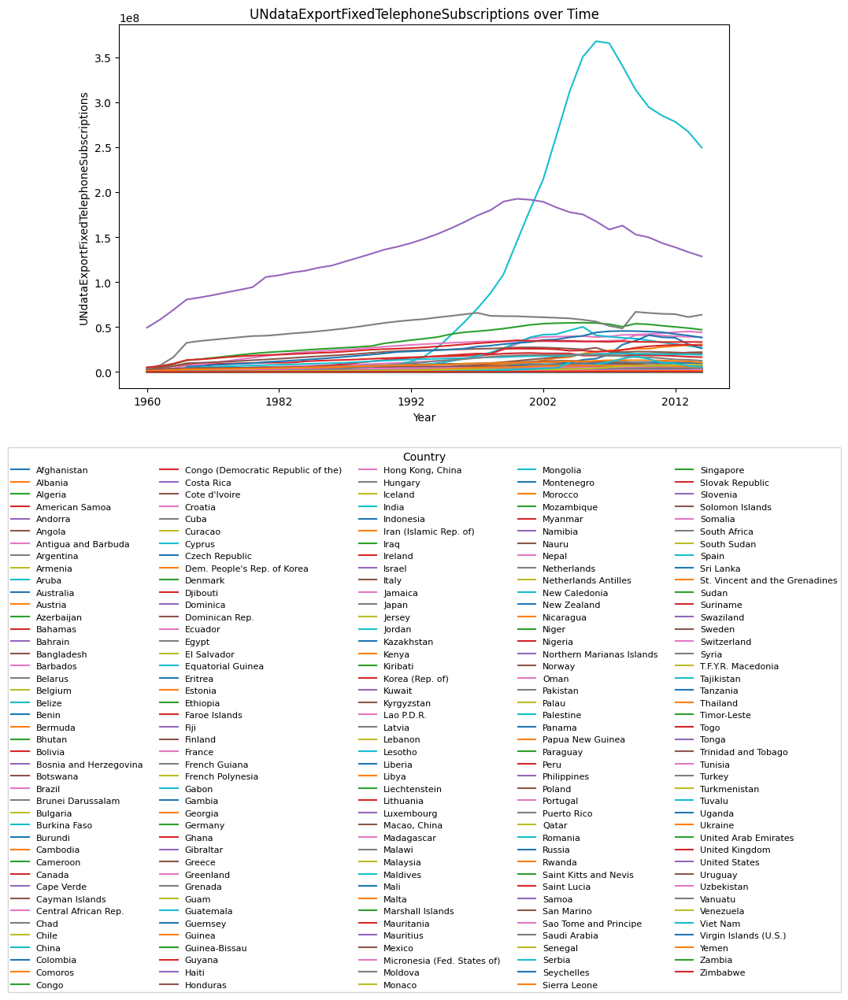

In [33]:

def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Move the legend to below the chart
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15))

    plt.show()


Maybe sorting legends by highest value in highest year could help use gleam more information from the data

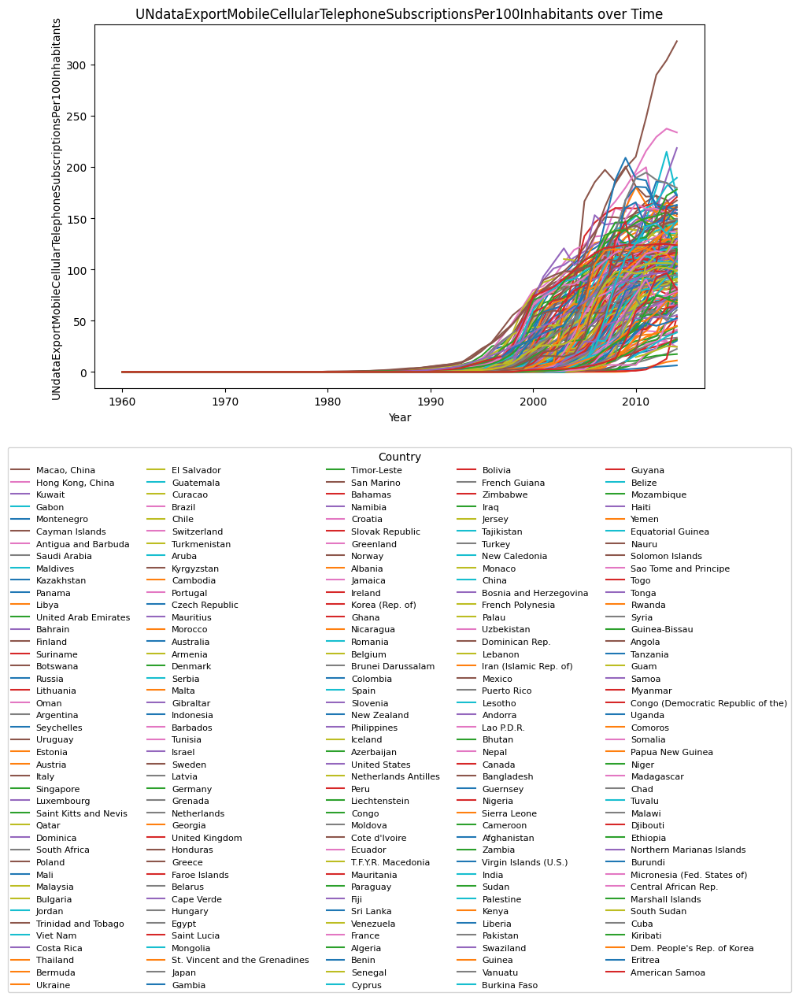

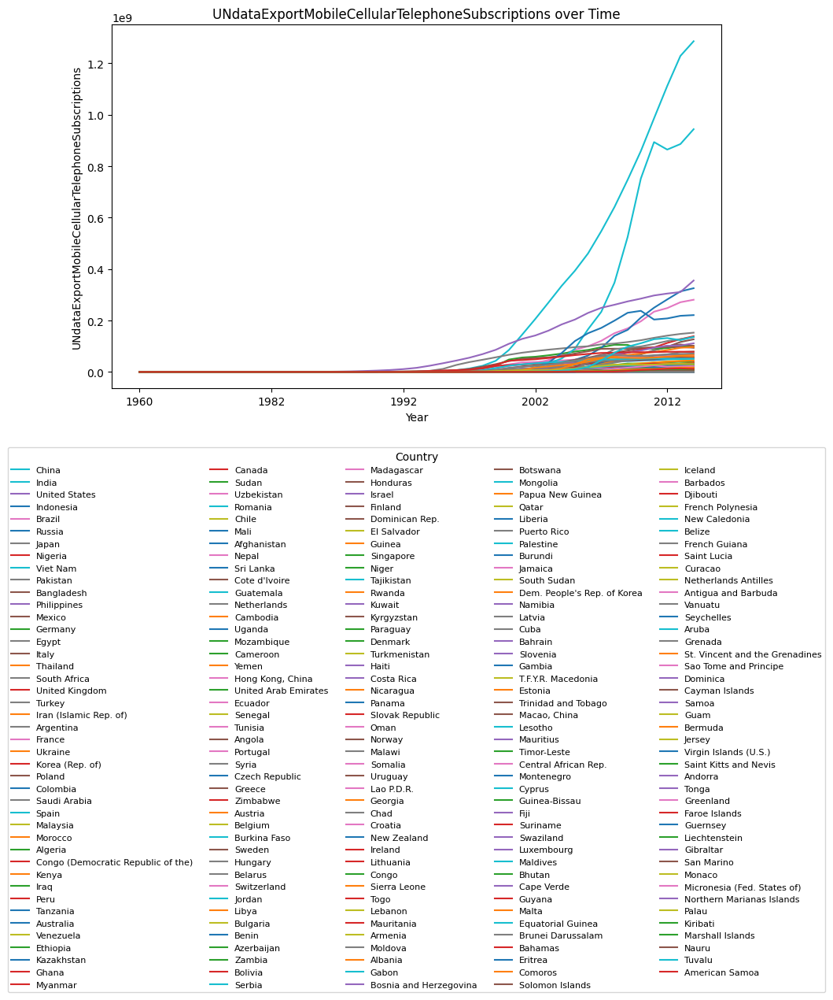

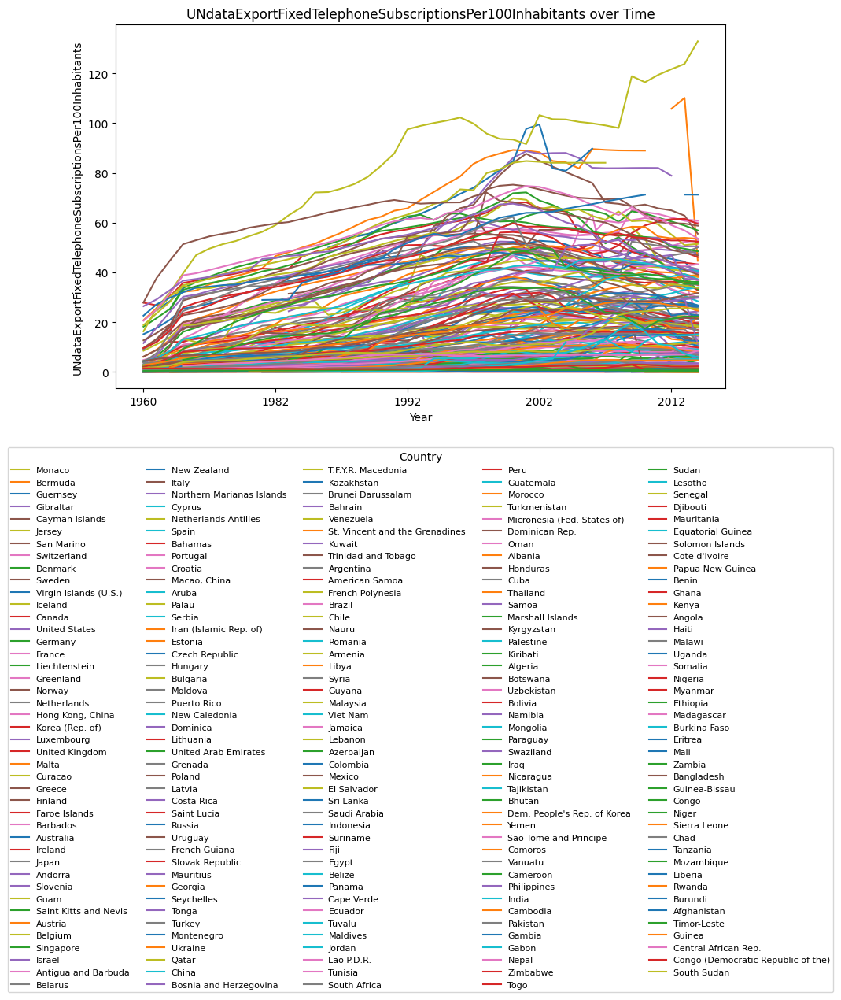

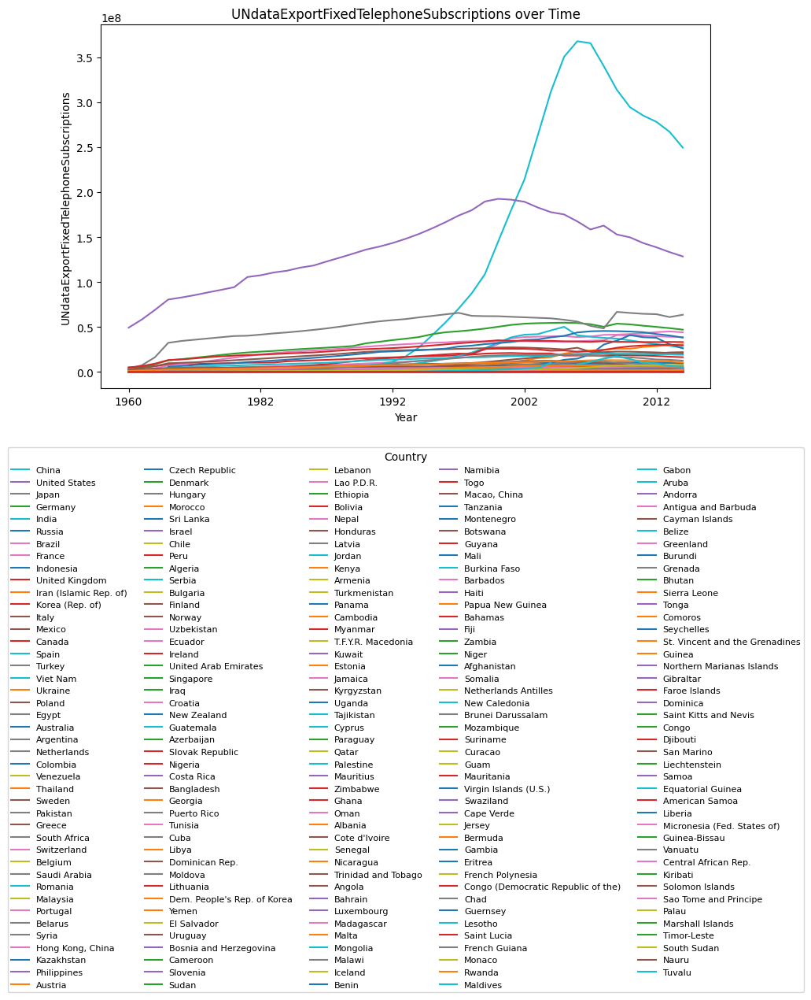

In [34]:
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Loop over each CSV file
for csv_file in csv_files:
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])
    # Create the line chart
    df_pivot.plot(figsize=(10, 6))
    plt.xlabel('Year')
    plt.ylabel(csv_file.split('.')[0])
    plt.title(csv_file.split('.')[0] + ' over Time')

    # Calculate the maximum value for each country in the current chart
    max_values_current = df_pivot.max().sort_values(ascending=False)
    sorted_countries = max_values_current.index.tolist()

    # Get the legend handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()

    # Pair the handles and labels and sort them based on the sorted_countries list
    sorted_handles_labels = sorted(zip(handles, labels), key=lambda x: sorted_countries.index(x[1]))

    # Unzip the handles and labels
    sorted_handles, sorted_labels = zip(*sorted_handles_labels)

    # Move the legend to below the chart and sort by maximum value
    plt.legend(title='Country', ncol=5, fontsize=8, loc='upper center', bbox_to_anchor=(0.5, -0.15), handles=sorted_handles, labels=sorted_labels)

    plt.show()

Plotly made reading such crowded plots easy.

In [35]:

# Define the clean_data function
def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    # Drop duplicate entries
    df = df.drop_duplicates(subset=['Country', 'Year'])
    # Remove country names that are numeric
    df = df[~df['Country'].str.match(r'^\d+$')]
    # Remove rows where Country is equal to 'footnoteSeqID'
    df = df[df['Country'] != 'footnoteSeqID']
    return df

# Define a list of CSV files
csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

# Initialize an empty list to store the traces for all the files
traces = []

# Loop over each CSV file
for i, csv_file in enumerate(csv_files):
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df, csv_file.split('.')[0])
    # Pivot the data to have years as rows and subscription types as columns
    df_pivot = df.pivot(index='Year', columns='Country', values=csv_file.split('.')[0])

    # Create an empty list to store the traces for the current file
    current_traces = []

    # Create a trace for each country
    for country in df_pivot.columns:
        trace = go.Scatter(x=df_pivot.index, y=df_pivot[country], mode='lines', name=country, legendgroup=country,
                           hovertemplate='%{y} %{name} in %{x}', line=dict(width=1))
        current_traces.append(trace)

    # Set the maximum value for each country as its legend rank
    max_values = df_pivot.max().to_dict()
    for trace in current_traces:
        trace['legendrank'] = max_values.get(trace['name'])

    # Show the legend for the last plot
    show_legend = True if i == len(csv_files) - 1 else False

    # Create the plot layout
    layout = go.Layout(title=csv_file.split('.')[0] + ' over Time',
                       xaxis=dict(title='Year'),
                       yaxis=dict(title=csv_file.split('.')[0]),
                       legend=dict(itemsizing='constant', orientation='h', xanchor='center', x=0.5, y=-0.15, traceorder='reversed'),
                       showlegend=show_legend)

    # Create the plot figure with traces for the current file
    fig = go.Figure(data=current_traces, layout=layout)

    # Show the figure
    fig.show()


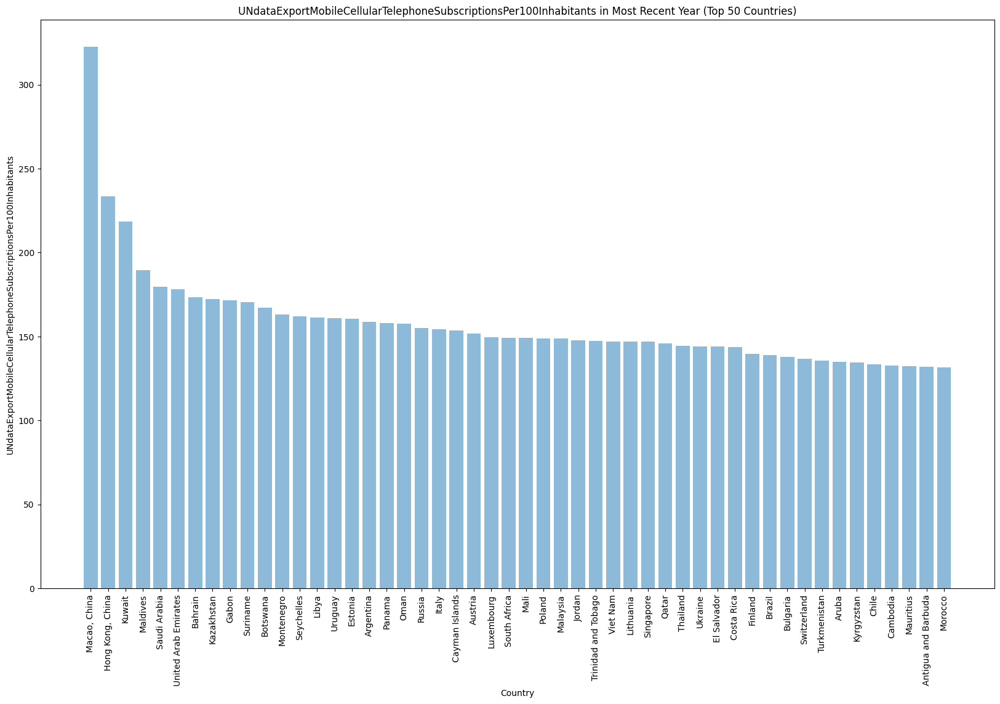

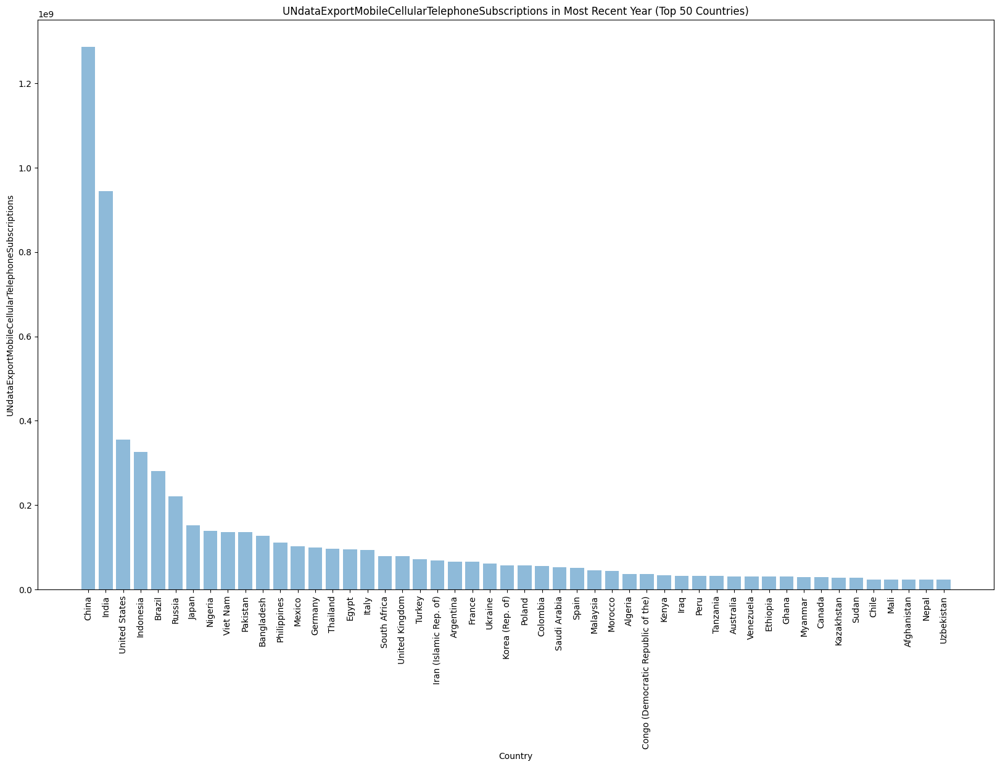

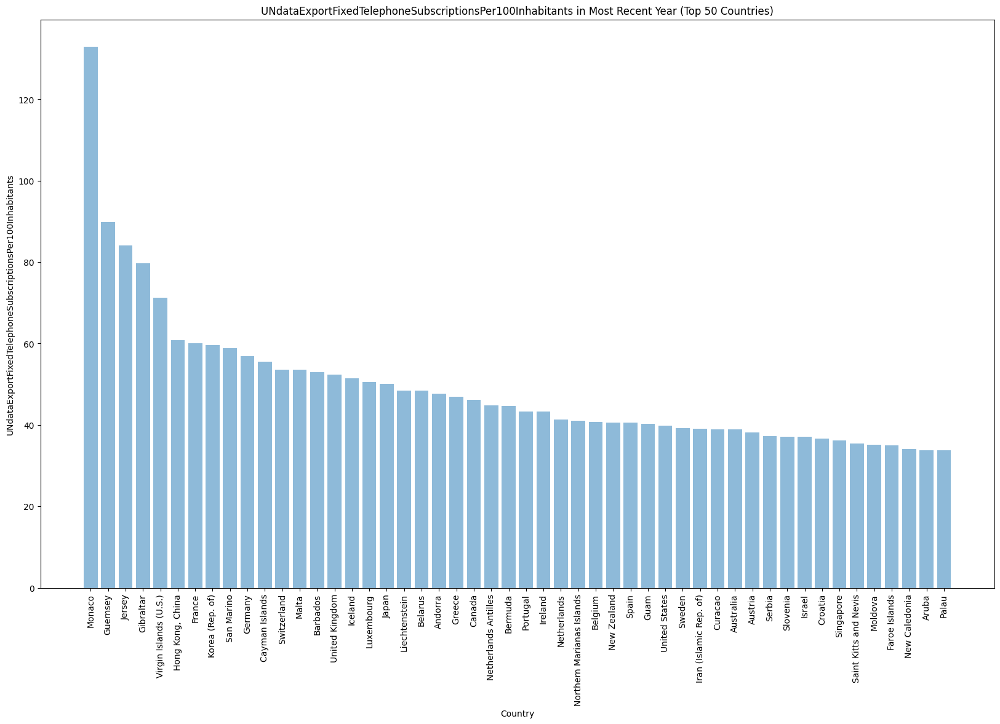

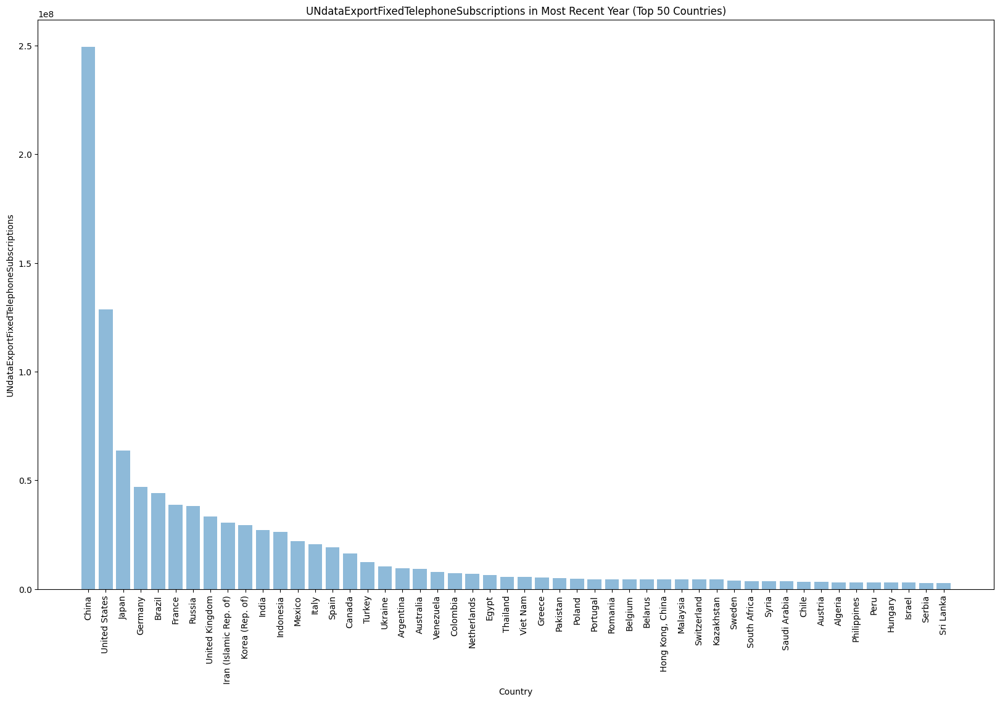

In [36]:

def clean_data(df, value_column_name):
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', value_column_name]
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df

csv_files = ['UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportMobileCellularTelephoneSubscriptions.csv', 'UNdataExportFixedTelephoneSubscriptionsPer100Inhabitants.csv', 'UNdataExportFixedTelephoneSubscriptions.csv']

for csv_file in csv_files:
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    df = clean_data(df, csv_file.split('.')[0])
    
    # Convert the 'Year' column to an integer
    df['Year'] = df['Year'].astype(int)
    
    # Keep only the most recent year for each country
    df_most_recent = df.loc[df.groupby('Country')['Year'].idxmax()]
    
    # Sort the data by the value and keep the top 20 countries
    df_most_recent = df_most_recent.sort_values(by=csv_file.split('.')[0], ascending=False).head(50)
    
    # Create bar plot
    fig, ax = plt.subplots(figsize=(20, 12))
    ax.bar(df_most_recent['Country'], df_most_recent[csv_file.split('.')[0]], alpha=0.5)
    
    # Set plot title, x-axis label, and y-axis label
    ax.set_title(csv_file.split('.')[0] + ' in Most Recent Year (Top 50 Countries)')
    ax.set_xlabel('Country')
    ax.set_ylabel(csv_file.split('.')[0])
    
    # Rotate x-axis labels
    plt.xticks(rotation=90)
    
    # Show plot
    plt.show()




Ratings by tax

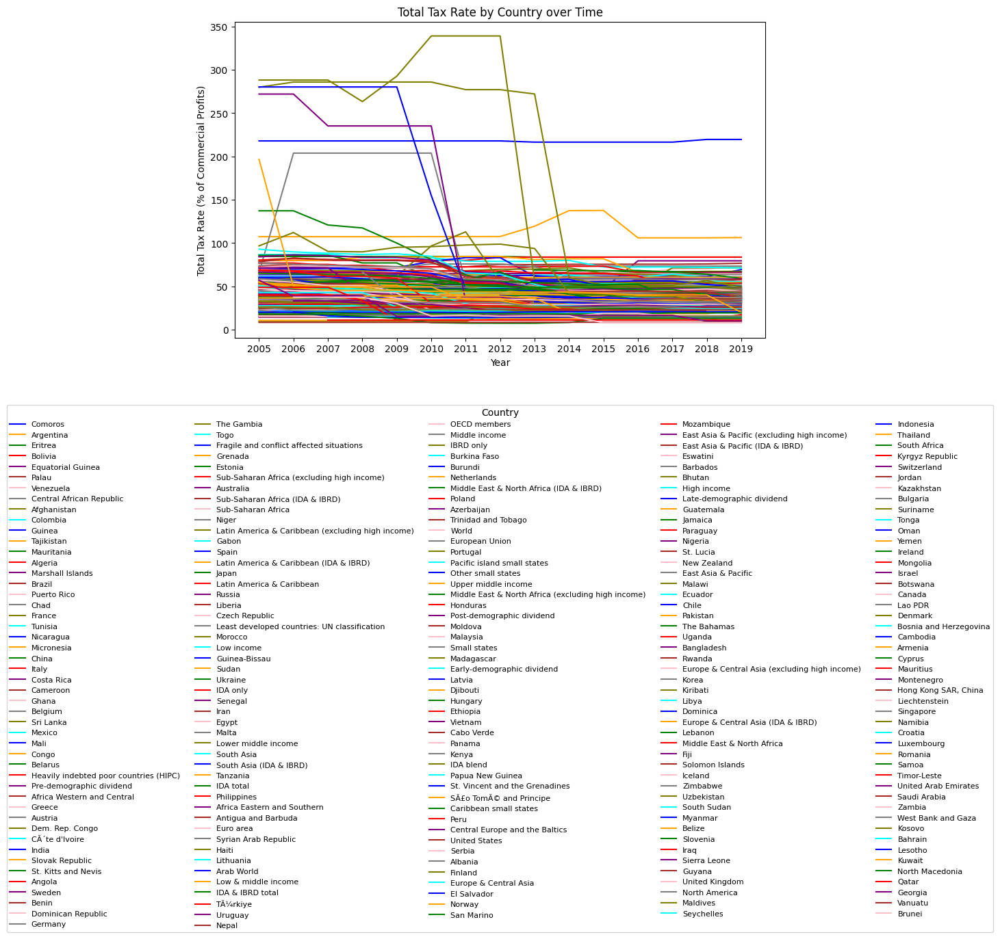

In [37]:
def clean_data(df):
    # Remove the Value Footnotes and footnoteSeqID columns
    df = df.drop(columns=['Value Footnotes'])
    # Rename the columns
    df.columns = ['Country', 'Year', 'Value']
    # Drop any duplicate entries for a given year and country combination
    df = df.drop_duplicates(subset=['Country', 'Year'], keep='last')
    # Drop any rows where the Value column is NaN
    df = df.dropna(subset=['Value'])
    # Convert the Value column to numeric
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    # Remove the last three rows
    df = df[:-3]
    return df

# Define a list of CSV files
csv_files = ['TotalTaxRatePercentOfCommercialProfits.csv']

# Create a list of colors for the countries
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']

# Create a figure and axes object
fig, ax = plt.subplots(figsize=(10,6))

# Set the color cycle to use a different color for each country
ax.set_prop_cycle(color=colors)

# Loop over each CSV file
for i, csv_file in enumerate(csv_files):
    # Read the data
    df = pd.read_csv(csv_file, quotechar='"', delimiter=',', quoting=1, skipinitialspace=True)
    # Clean the data
    df = clean_data(df)
    # Pivot the data to have years as rows and countries as columns
    df_pivot = df.pivot(index='Year', columns='Country', values='Value')
    # Sort the data by the most recent year
    df_pivot = df_pivot.sort_values(by=df_pivot.index[-1], axis=1, ascending=False)
    # Plot each country's line on the same axis
    for country in df_pivot.columns:
        ax.plot(df_pivot.index, df_pivot[country], label=country)
        
# Set the x- and y-axis labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Total Tax Rate (% of Commercial Profits)')
ax.set_title('Total Tax Rate by Country over Time')

# Add a legend to the plot
ax.legend(title='Country', fontsize=8, loc='upper center', ncol=5, bbox_to_anchor=(0.5, -0.2))

# Show the plot
plt.show()



Intersection of top 100 contries in the 'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv', and, 'UNdataExportPercentageOfIndividualsUsingTheInternet.csv'datasets, and the intersection of top 100 contries in the 'CPIABusinessRegulatoryEnvironmentRating1to6.csv', 'CPIAMacroeconomicManagementRating1to6.csv', 'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv', and 'CPIATradeRating1to6.csv'

{'Korea (Rep. of)', 'Faroe Islands', 'Poland', 'Hong Kong, China', 'Aruba', 'Latvia', 'Japan', 'Luxembourg', 'New Zealand', 'United Kingdom', 'Greece', 'Cayman Islands', 'Germany', 'Bahrain', 'Singapore', 'Belarus', 'Georgia', 'United States', 'Saudi Arabia', 'Belgium', 'Kazakhstan', 'United Arab Emirates', 'Morocco', 'Bulgaria', 'Kuwait', 'Netherlands', 'Maldives', 'Malta', 'Dominica', 'Brunei Darussalam', 'Sweden', 'Portugal', 'Macao, China', 'Chile', 'Gibraltar', 'Colombia', 'Argentina', 'Montenegro', 'Russia', 'Iceland', 'Antigua and Barbuda', 'Serbia', 'Slovak Republic', 'Austria', 'Lithuania', 'Finland', 'Costa Rica', 'Qatar', 'Barbados', 'Trinidad and Tobago', 'Hungary', 'Liechtenstein', 'Saint Kitts and Nevis', 'Oman', 'Estonia', 'Israel', 'Czech Republic', 'Norway', 'South Africa', 'Switzerland', 'San Marino', 'Australia', 'Uruguay', 'Azerbaijan', 'Denmark', 'Seychelles', 'Brazil', 'Malaysia', 'Slovenia', 'Italy'}
{'Djibouti', 'Bosnia and Herzegovina', 'Upper middle income', '

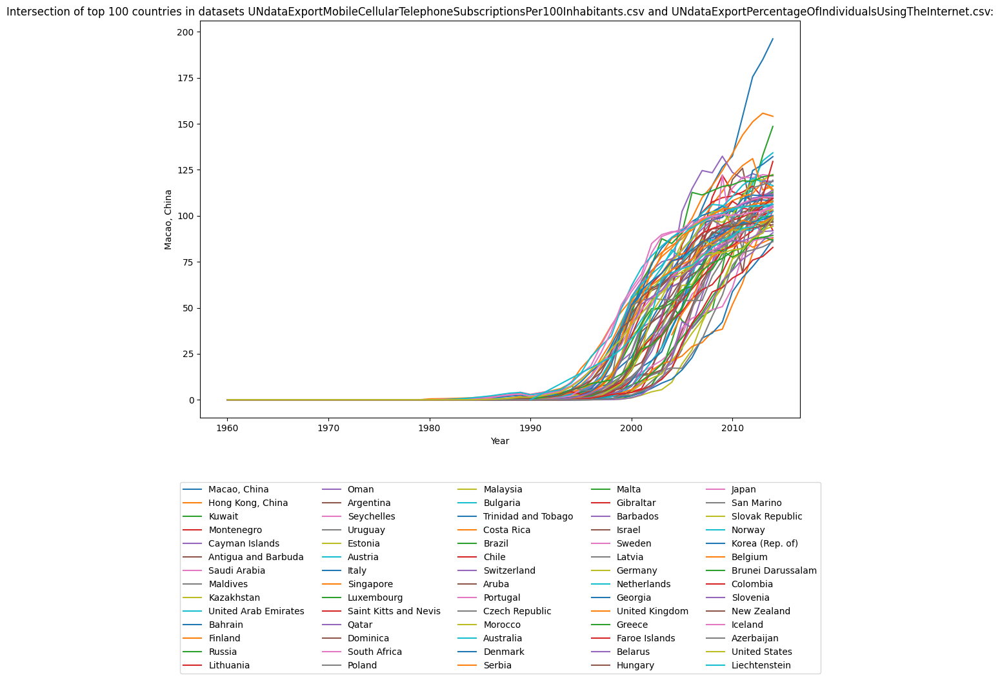

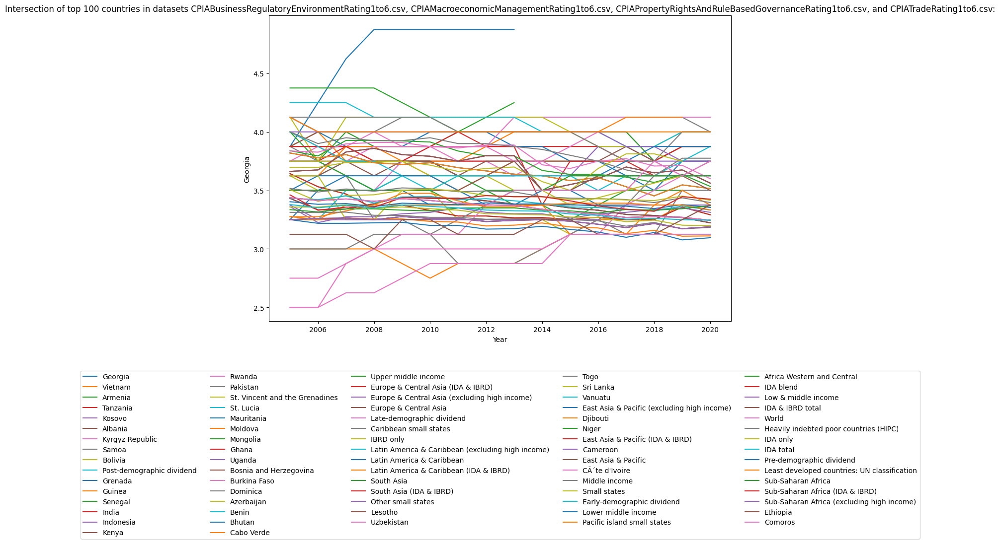

In [38]:
csv_files = [
    'UNdataExportMobileCellularTelephoneSubscriptionsPer100Inhabitants.csv',
    'UNdataExportPercentageOfIndividualsUsingTheInternet.csv',
    'CPIABusinessRegulatoryEnvironmentRating1to6.csv',
    'CPIAMacroeconomicManagementRating1to6.csv',
    'CPIAPropertyRightsAndRuleBasedGovernanceRating1to6.csv',
    'CPIATradeRating1to6.csv'
]

def read_csv_remove_bad_lines(csv_file):
    expected_num_columns = 4

    with open(csv_file, 'r', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)

        header = next(reader)
        valid_lines = [header]

        for line in reader:
            if len(line) == expected_num_columns:
                valid_lines.append(line)

    return pd.DataFrame(valid_lines[1:], columns=valid_lines[0])

def read_and_process_csv(csv_file):
    df = read_csv_remove_bad_lines(csv_file)
    df = df.drop(columns=['Value Footnotes'])
    df.columns = ['Country', 'Year', 'Value']
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
    df['Value'] = pd.to_numeric(df['Value'], errors='coerce')
    df = df.drop_duplicates(subset=['Country', 'Year'])
    df = df[~df['Country'].str.match(r'^\d+$')]
    df = df[df['Country'] != 'footnoteSeqID']
    return df
def get_most_recent_top_100(df):
    most_recent_years = df.groupby('Country')['Year'].max()
    most_recent_data = pd.merge(df, most_recent_years, on=['Country', 'Year'])
    top_100 = most_recent_data.nlargest(100, 'Value')['Country']
    return set(top_100)

def create_line_chart(df, common_countries, title):
    df_filtered = df[df['Country'].isin(common_countries)]
    df_grouped = df_filtered.groupby(['Country', 'Year'], as_index=False).mean()
    df_pivoted = df_grouped.pivot(index='Year', columns='Country', values='Value')
    # Sort the countries based on their highest value in their most recent year
    sorted_countries = df_filtered.groupby('Country')['Value'].max().sort_values(ascending=False).index.tolist()
    plt.figure(figsize=(12, 8))
    for country in sorted_countries:
        sns.lineplot(data=df_pivoted[country], label=country)
    plt.title(title)
    plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=5)
    plt.show()

    
dataframes = [read_and_process_csv(csv_file) for csv_file in csv_files]

top_100_countries_list = [get_most_recent_top_100(df) for df in dataframes]

# Find the intersection of top 100 countries in datasets 1 and 2
common_top_100_datasets_1_and_2 = set.intersection(top_100_countries_list[0], top_100_countries_list[1])
print(common_top_100_datasets_1_and_2)

# Find the intersection of top 100 countries in datasets 3, 4, 5, and 6
common_top_100_datasets_3_to_6 = set.intersection(top_100_countries_list[2], top_100_countries_list[3], top_100_countries_list[4], top_100_countries_list[5])
print(common_top_100_datasets_3_to_6)

# Print common top 100 countries in datasets 1 and 2
print("Check to make sure there are countries that lie at the Intersection of top 100 countries in datasets % internet users, and mobile subscriptions per 100 residents:")
print(sorted(list(common_top_100_datasets_1_and_2)))
print()

# Print common top 100 countries in datasets 3, 4, 5, and 6
print("Check to make sure there are countries that lie at the Intersection of top 100 countries in datasets Business Regulatory Environment Rating, Macroeconomic Management Rating, Property Rights And Rule Based Governance, and Trade Ratings 1 to 6:")
print(sorted(list(common_top_100_datasets_3_to_6)))

# Create line charts for the intersection of top 100 countries in datasets 1 and 2
create_line_chart(pd.concat([dataframes[0], dataframes[1]]),
                  common_top_100_datasets_1_and_2,
                  'Intersection of top 100 countries in datasets {} and {}:'.format(csv_files[0], csv_files[1]))

# Create line charts for the intersection of top 100 countries in datasets 3, 4, 5, and 6
create_line_chart(pd.concat([dataframes[2], dataframes[3], dataframes[4], dataframes[5]]),
                  common_top_100_datasets_3_to_6,
                  'Intersection of top 100 countries in datasets {}, {}, {}, and {}:'.format(csv_files[2], csv_files[3], csv_files[4], csv_files[5]))


Time Required to start a business in days, however alphabetically sorted legend makes graph hard to read

C:\Users\user\AppData\Local\Temp\ipykernel_21016\3261315815.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



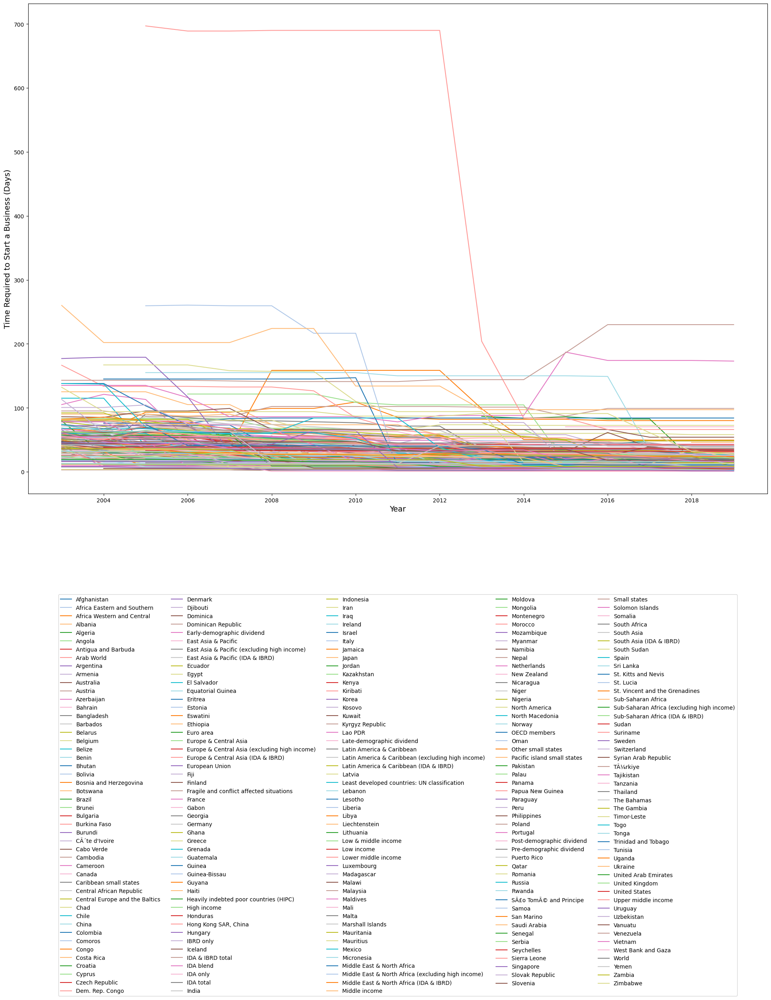

In [39]:

# Load data from CSV file
df = pd.read_csv('TimeRequiredToStartABusinessInDays.csv', header=0)

# Pivot data to create a separate line for each country
df_pivot = df.pivot(index='Year', columns='Country or Area', values='Value')

# Create figure and axis objects with larger figsize
fig, ax = plt.subplots(figsize=(24, 16))

# Define colormap
cmap = cm.get_cmap('tab20')

# Loop through each country and plot a line with a unique color from the colormap
for i, country in enumerate(df['Country or Area'].unique()):
    color = cmap(i % cmap.N)
    ax.plot(df_pivot.index, df_pivot[country], label=country, color=color)

# Add axis labels and legend
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Time Required to Start a Business (Days)', fontsize=14)

# Adjust legend to show in columns of 5 or less and position it under the graph
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=5)

# Show the plot
plt.show()



Time Required To Start A Business In Days analysis, legend sorted by most days to start a new business

C:\Users\user\AppData\Local\Temp\ipykernel_21016\509204438.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



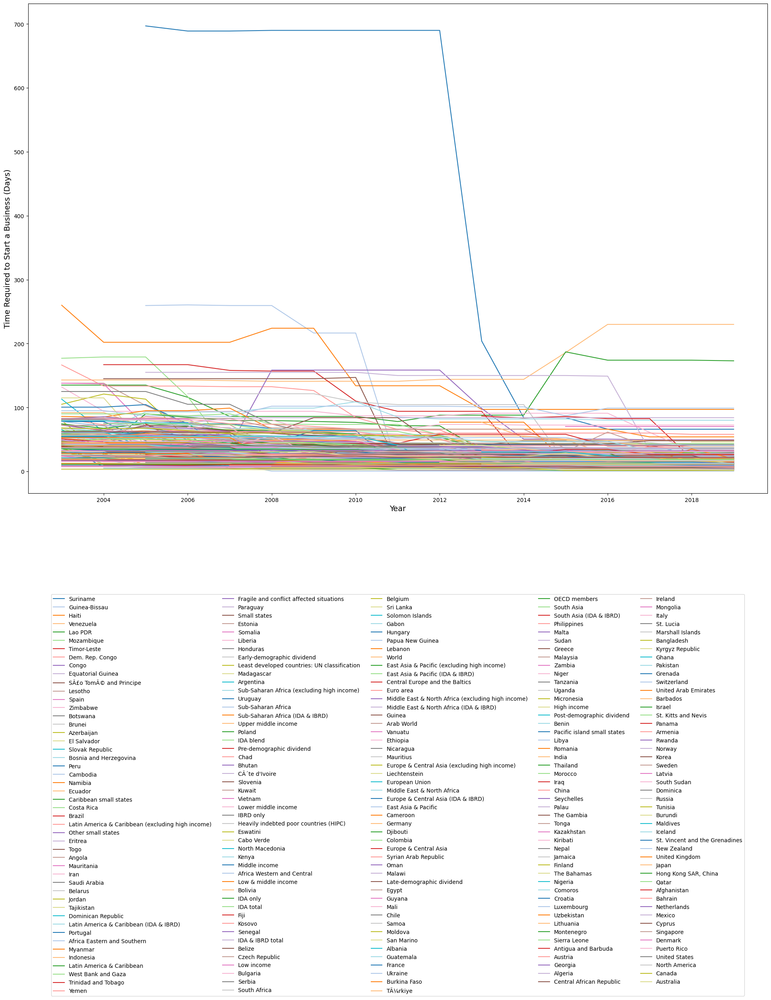

In [40]:

# Load data from CSV file
df = pd.read_csv('TimeRequiredToStartABusinessInDays.csv', header=0)

# Pivot data to create a separate line for each country
df_pivot = df.pivot(index='Year', columns='Country or Area', values='Value')

# Create figure and axis objects with larger figsize
fig, ax = plt.subplots(figsize=(24, 16))

# Define colormap
cmap = cm.get_cmap('tab20')

# Create dictionary to map country to max value and year
max_values = {}
for country in df['Country or Area'].unique():
    max_value = df.loc[df['Country or Area'] == country, 'Value'].max()
    max_year = df.loc[(df['Country or Area'] == country) & (df['Value'] == max_value), 'Year'].values[0]
    max_values[country] = (max_value, max_year)

# Sort dictionary by value and year
sorted_max_values = sorted(max_values.items(), key=lambda x: (-x[1][0], -x[1][1]))

# Loop through each country and plot a line with a unique color from the colormap
for i, (country, _) in enumerate(sorted_max_values):
    color = cmap(i % cmap.N)
    ax.plot(df_pivot.index, df_pivot[country], label=country, color=color)

# Add axis labels and legend
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Time Required to Start a Business (Days)', fontsize=14)

# Adjust legend to show in columns of 5 or less and position it under the graph
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=5)

# Show the plot
plt.show()


The kaggle file check

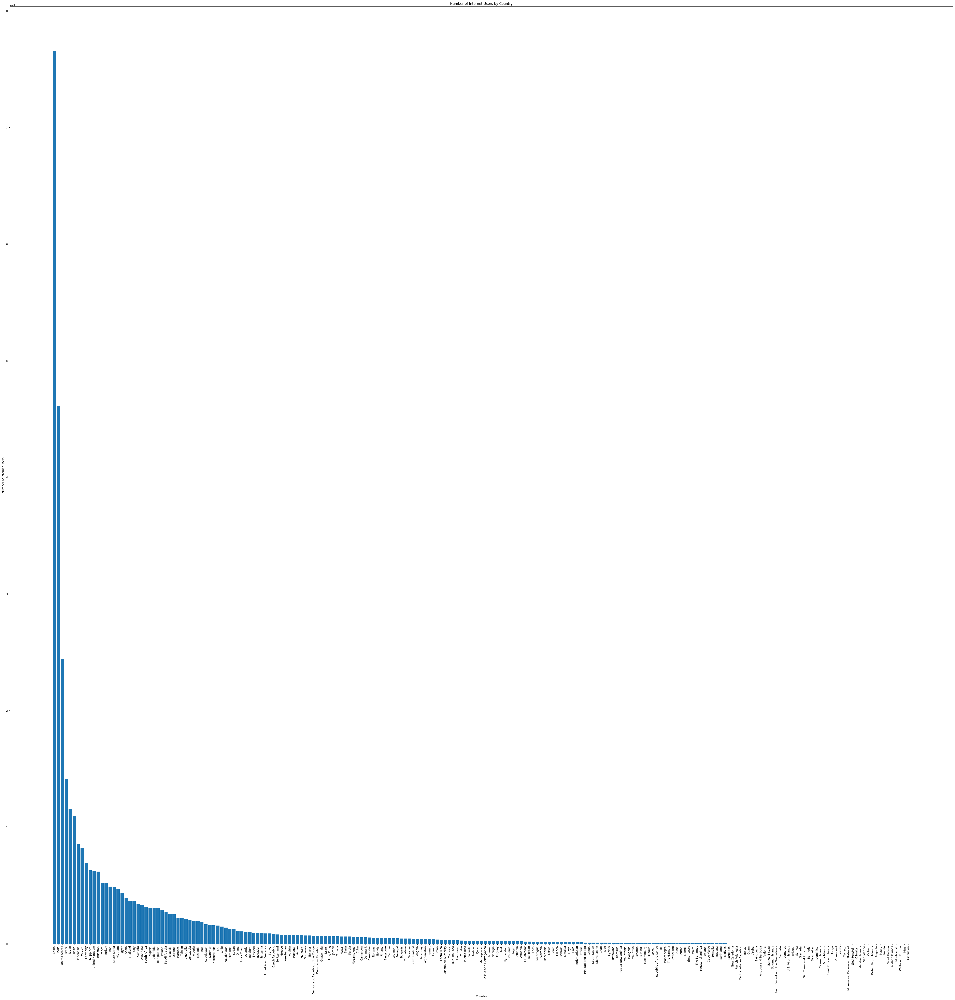

In [41]:

# Load data from CSV file
df = pd.read_csv('ListOfCountriesByNumberOfInternetUsers.csv', header=0)

# Remove commas and convert to integers
df['Internet Users'] = df['Internet Users'].apply(lambda x: int(x.replace(',', '')))

# Sort data by Internet Users in descending order
df = df.sort_values(by='Internet Users', ascending=False)

# Create figure and axis objects
fig, ax = plt.subplots(figsize=(60, 60))

# Create bar plot
ax.bar(df['Country or Area'], df['Internet Users'])

# Set plot title, x-axis label, and y-axis label
ax.set_title('Number of Internet Users by Country')
ax.set_xlabel('Country')
ax.set_ylabel('Number of Internet Users')

# Rotate x-axis labels
plt.xticks(rotation=90)

# Show plot
plt.show()

Since my data only went to 2014, I used a kaggle list with more recent data, however it was based on users and not percentage. I think the Kaggle list actually supports the fact that this data, while only from 2014 in some cases, is still representative of global trends, there are a lot of similarities between the two lists.

In [42]:


# Read in the first CSV file
with open('UNdataExportPercentageOfIndividualsUsingTheInternet.csv', newline='', encoding='utf-8') as f:
    reader = csv.reader(f)
    data = [row for row in reader if row]

# Get the top 100 countries based on the most recent year
top_100_countries = []
country_counts = {}
for row in data[1:]:
    if len(row) < 2:  # Skip rows with less than two columns
        continue
    country = row[0]
    year = row[1]
    if country not in country_counts:
        country_counts[country] = 0
    if year == "2014":
        if len(row) < 3:  # Skip rows with less than three columns
            continue
        value = float(row[2])
        country_counts[country] += value
for country, count in sorted(country_counts.items(), key=lambda x: x[1], reverse=True)[:100]:
    top_100_countries.append(country)

# Read in the second CSV file and check for duplicate country names
with open('ListOfCountriesByNumberOfInternetUsers.csv', newline='') as f:
    reader = csv.reader(f)
    internet_users = [row[0] for row in reader if row]  # Collect first column of non-empty rows

top_100_set = set(top_100_countries)
internet_users_set = set(internet_users)

intersection = top_100_set.intersection(internet_users_set)
print(intersection)
sorted_intersection = sorted(intersection)
print(sorted_intersection)
print(sorted_intersection)


{'Faroe Islands', 'Poland', 'Bosnia and Herzegovina', 'Latvia', 'New Zealand', 'Andorra', 'Singapore', 'Netherlands', 'Maldives', 'Dominica', 'Portugal', 'Tunisia', 'Monaco', 'Costa Rica', 'Qatar', 'Barbados', 'Hungary', 'Liechtenstein', 'Czech Republic', 'France', 'South Africa', 'Australia', 'Azerbaijan', 'Brazil', 'Guam', 'Aruba', 'United Kingdom', 'Ireland', 'Bahrain', 'Belarus', 'Venezuela', 'Malta', 'Romania', 'Russia', 'Iceland', 'Saint Lucia', 'French Polynesia', 'Uruguay', 'New Caledonia', 'Japan', 'Spain', 'Luxembourg', 'Greece', 'China', 'Georgia', 'United States', 'Saudi Arabia', 'Belgium', 'Morocco', 'Moldova', 'Bulgaria', 'Kuwait', 'Croatia', 'Chile', 'Colombia', 'Argentina', 'Antigua and Barbuda', 'Serbia', 'Lebanon', 'Saint Kitts and Nevis', 'Oman', 'Norway', 'Switzerland', 'Denmark', 'Malaysia', 'Slovenia', 'Albania', 'Bermuda', 'Armenia', 'Cayman Islands', 'Germany', 'Kazakhstan', 'Greenland', 'United Arab Emirates', 'Sweden', 'Montenegro', 'Austria', 'Canada', 'Lithu

Countries in both internet lists, word cloud

In [43]:


# Read in the first CSV file
with open('UNdataExportPercentageOfIndividualsUsingTheInternet.csv', newline='', encoding='utf-8') as f:
    reader = csv.reader(f)
    data = [row for row in reader if row]

# Get the top 100 countries based on the most recent year
top_100_countries = []
country_counts = {}
for row in data[1:]:
    if len(row) < 2:  # Skip rows with less than two columns
        continue
    country = row[0]
    year = row[1]
    if country not in country_counts:
        country_counts[country] = 0
    if year == "2014":
        if len(row) < 3:  # Skip rows with less than three columns
            continue
        value = float(row[2])
        country_counts[country] += int(value)
for country, count in sorted(country_counts.items(), key=lambda x: x[1], reverse=True)[:100]:
    top_100_countries.append(country)

# Read in the second CSV file and check for duplicate country names
with open('ListOfCountriesByNumberOfInternetUsers.csv', newline='') as f:
    reader = csv.reader(f)
    internet_users = [row[0] for row in reader if row]  # Collect first column of non-empty rows

top_100_set = set(top_100_countries)
internet_users_set = set(internet_users)

intersection = top_100_set.intersection(internet_users_set)

# Generate a string from the intersection list with each country name repeated based on its count in the first CSV
text = ' '.join([f'"{country}" ' * country_counts[country] for country in intersection])

# Set up image and font
background_color = "black"
width, height = 1600, 800
img = Image.new('RGB', (width, height), background_color)
draw = ImageDraw.Draw(img)
font_path = "arial.ttf" # Replace with your preferred font path
font_size = 15
font = ImageFont.truetype(font_path, font_size)

# Define function to generate random color
def random_color():
    return tuple(random.randint(0, 255) for _ in range(3))



# Generate word cloud
words = text.split()
word_counts = {}
for word in words:
    if word not in word_counts:
        word_counts[word] = 0
    word_counts[word] += 1

max_count = max(word_counts.values())
exclude_words = ['and', 'the', 'of', 'in']

for word, count in word_counts.items():
    if word.lower() in exclude_words:
        continue
    
    size = int(60 * count / max_count)
    draw.text((random.randint(0, width), random.randint(0, height)), word.replace('"',''), fill=random_color(), font=ImageFont.truetype(font_path, size))
# Display the word cloud
img.show()

All Countries on Black Background

In [44]:

# Read in the CSV file of countries
with open('ListOfCountriesByNumberOfInternetUsers.csv', newline='') as f:
    reader = csv.reader(f)
    countries = [row[0] for row in reader if row]  # Collect first column of non-empty rows
    countries = sorted(countries)

# Set up image and font
background_color = "black"
width, height = 1600, 800
img = Image.new('RGB', (width, height), background_color)
draw = ImageDraw.Draw(img)
font_path = "arial.ttf" # Replace with your preferred font path
font_size = 15
font = ImageFont.truetype(font_path, font_size)

# Calculate the maximum number of columns and rows to fit all the countries in a grid
num_cols = int(width / (font_size * 10))
num_rows = int(height / (font_size * 2))

# Draw each country in a random color on the image in a grid-like pattern
for i, country in enumerate(countries):
    col = i % num_cols
    row = i // num_cols
    x = col * (width / num_cols) + (width / num_cols) / 2
    y = row * (height / num_rows) + (height / num_rows) / 2
    color = random_color()
    draw.text((x, y), country, fill=color, font=font, anchor='mm')

# Display the image
img.show()